
# Training for production
copy of BBB_BN_TV_FCN4_SkipC_wDiapCntr_test10_2D_ref7_LRx1.ipynb, prod run 1

In [24]:
#imports 
import sys
import os
import time
import json

import numpy as np
import matplotlib.pyplot as plt
import IPython.display as ipyd
import tensorflow as tf
from tensorflow.python.client import timeline

from utils import net_utils as nu
from utils import imgio as iio
from utils import TrainUtils as tu
from utils import dataset as ds

plt.style.use('ggplot')

In [2]:
devs = [5, 7] # one for training another for preproc (deprecated)
time.sleep((devs[0]%4)*60*3)

## Load dataset

In [3]:
d, v, desc = ds.load_train_val_dataset('data/prepared_datasets/ds_big_all10_ref07/',
                              preproc_devs=('/gpu:1',),
                              minibatch_size=4,
                              queue_len=8,
                              shuffle_output=True,
                              num_proc_threads=8,
                              augment_training=True)

dataset description: "Big dataset (ids=1,2,3,5) labeled by Adrian,Luca,Mykhailo,Sidar
    (04.2021, corrected, aligned data. new format. histogram-normalized input (ref. dataset 7). mean-std norm within 2.5-97.5%).
    Contains labels for cells, diapedesing part, centroids, and exp(-distance/10um) from diapedesing cell part.
    Validation dataset - portion of the dataset, no overlap"


In [4]:
def start_queue(sess):
    pass
    d.start_queues(session=sess)
    #v.start_queues(session=sess)
    
def end_queue(sess):
    pass

# Create Net

In [5]:
MODELNAME = 'BBB_BN_TV_FCN4_HN_CDC_2D'

In [6]:
def lrelu(x, name=tf.nn.leaky_relu.__name__):
    return tf.nn.leaky_relu(x, alpha=0.05, name=name)

In [7]:
g = d.get_graph()
numFilters = [64,     64,     128,    128,    256,    256,    512,]  # last - num classes
filters =    [[7, 7], [3, 3], [3, 3], [3, 3], [3, 3], [3, 3], [3, 3]]
pool =       [[1, 1], [2, 2], [1, 1], [2, 2], [1, 1], [2, 2], [1, 1]]

target = 'nll'

layersP = []

x_before_MP=[]

with g.as_default():
    phase_train = tf.placeholder(tf.bool, name='phase_train')

    with tf.device('/gpu:0'):
        stk_tr, lbl_tr, dia_tr, cnt_tr, dst_tr  = d.get_minibatch_stream()  # try diapedesis
        #stk_vl, lbl_vl, dia_vl  = v.get_minibatch_stream()
        
        stk_vl, lbl_vl, dia_vl, cnt_vl, dst_vl = stk_tr, lbl_tr, dia_tr, cnt_tr, dst_tr
        
        stk0, lbl0, dia0, cnt0, dst0 = tf.cond(phase_train,
                                         lambda : (stk_tr, lbl_tr, dia_tr, cnt_tr, dst_tr),
                                         lambda: (stk_vl, lbl_vl, dia_vl, cnt_vl, dst_vl))

        #stk0 = tf.placeholder(dtype=tf.float32, shape=(None, 5, 256, 256))
        #lbl0 = tf.placeholder(dtype=tf.int32, shape=(None, 5, 256, 256))
        #dia0 = tf.placeholder(dtype=tf.int32, shape=(None, 5, 256, 256))
        
        stk = tf.transpose(stk0, perm=(0,2,3,1))[..., 2:3]
        lbl = tf.reshape(lbl0[:,2:3,...], (-1, 256, 256, 1))
        dia = tf.reshape(dia0[:,2:3,...], (-1, 256, 256, 1))
        cnt = tf.reshape(cnt0[:,2:3,...], (-1, 256, 256, 1))
        dst = tf.reshape(dst0[:,2:3,...], (-1, 256, 256, 1))
                
        stack = tf.identity(stk, 'stack')
        label = tf.identity(lbl, 'label')
        diapd = tf.identity(dia, 'diapd')
        centr = tf.identity(cnt, 'centr')
        dedst = tf.identity(dst, 'dedst')  # exponential distance from diapedesing cell
        
        x = stack
        for layerIdx, nFilt in enumerate(numFilters):
            k = filters[layerIdx]
            p = pool[layerIdx]

            x, *_ = nu.conv_2D(x,
                               nFilt,
                               name='L%d' % layerIdx,
                               k_w=k[0],
                               k_h=k[1],
                               batch_norm_train_phase=None if layerIdx==0 else phase_train,
                               dropout_keep_prob=None if layerIdx==0 else 0.8,
                               padding='SAME',
                               activation=lrelu, initializer=tf.initializers.he_uniform
                              )
            
            if np.max(p) > 1:
                x_before_MP.append(x)
                x = nu.max_pool_2d(
                    x,
                    name='MP%d' % layerIdx,
                    k_w=p[0],
                    k_h=p[1],
                    s_x=p[0],
                    s_y=p[1])
            layersP.append(x)
            
        layerIdx = len(numFilters)
        
        x, *_ = nu.upscale_2D(x, 256, 2, 2, padding='SAME', name='L%d' % layerIdx,
                              batch_norm_train_phase=phase_train,
                              activation=lrelu,
                             )
        layersP.append(x)
        layerIdx += 1

        x = tf.concat((x, x_before_MP[2]), axis=-1, name='concat%d' % layerIdx)
        layersP.append(x)
        layerIdx += 1

        x, *_ = nu.conv_2D(x, 256,
                           batch_norm_train_phase=phase_train, 
                           dropout_keep_prob=0.8, padding='SAME', name='L%d' % layerIdx,
                           activation=lrelu, initializer=tf.initializers.he_uniform
                          )
        layersP.append(x)
        layerIdx += 1
        x, *_ = nu.conv_2D(x, 256,
                           batch_norm_train_phase=phase_train, 
                           dropout_keep_prob=0.8, padding='SAME', name='L%d' % layerIdx,
                           activation=lrelu, initializer=tf.initializers.he_uniform
                          )
        layersP.append(x)
        layerIdx += 1
        
        
        x, *_ = nu.upscale_2D(x, 128, 2, 2, padding='SAME', name='L%d' % layerIdx,
                              batch_norm_train_phase=phase_train,
                              activation=lrelu
                             )
        layersP.append(x)
        layerIdx += 1

        x = tf.concat((x, x_before_MP[1]), axis=-1, name='concat%d' % layerIdx)
        layersP.append(x)
        layerIdx += 1

        x, *_ = nu.conv_2D(x, 128,
                           batch_norm_train_phase=phase_train, 
                           dropout_keep_prob=0.8, padding='SAME', name='L%d' % layerIdx,
                           activation=lrelu, initializer=tf.initializers.he_uniform
                          )
        layersP.append(x)
        layerIdx += 1
        x, *_ = nu.conv_2D(x, 128, 
                           batch_norm_train_phase=phase_train, 
                           dropout_keep_prob=0.8, padding='SAME', name='L%d' % layerIdx,
                           activation=lrelu, initializer=tf.initializers.he_uniform
                          )
        layersP.append(x)
        layerIdx += 1
        
        x, *_ = nu.upscale_2D(x, 64, 2, 2, padding='SAME', name='L%d' % layerIdx,
                              batch_norm_train_phase=phase_train,
                              activation=lrelu
                             )
        layersP.append(x)
        layerIdx += 1

        x = tf.concat((x, x_before_MP[0]), axis=-1, name='concat%d' % layerIdx)
        layersP.append(x)
        layerIdx += 1

        x, *_ = nu.conv_2D(x, 64,
                           batch_norm_train_phase=phase_train, 
                           dropout_keep_prob=0.8, padding='SAME', name='L%d' % layerIdx,
                           activation=lrelu, initializer=tf.initializers.he_uniform
                          )
        layersP.append(x)
        layerIdx += 1
        
        x, *_ = nu.conv_2D(x, 64,
                           batch_norm_train_phase=phase_train, 
                           dropout_keep_prob=0.8, padding='SAME', name='L%d' % layerIdx,
                           activation=lrelu, initializer=tf.initializers.he_uniform
                          )
        layersP.append(x)
        layerIdx += 1
        
        rich_layer = x
        x, *_ = nu.conv_2D(x, 2, name='L%d' % layerIdx,
                           k_w=1,
                           k_h=1,
                           activation=None,
                           padding='SAME',
                           initializer=tf.initializers.he_uniform
                          )
        layersP.append(x)
        layerIdx += 1

        L = x

        logits_cd = x#[..., :2]
        Y = nu.sigmoid(logits_cd, 'Classifier')
        
        x, *_ = nu.conv_2D(rich_layer, n_output_ch=16, name='L%d' % layerIdx,
                           batch_norm_train_phase=phase_train,
                           dropout_keep_prob=0.9, padding='SAME',
                           activation=lrelu, initializer=tf.initializers.he_uniform
                          )
        layersP.append(x)
        layerIdx += 1
        x, *_ = nu.conv_2D(x, n_output_ch=1, name='L%d' % layerIdx,
                           activation=None, padding='SAME',
                           initializer=tf.initializers.he_uniform
                          )
        layersP.append(x)
        layerIdx += 1
        
        x = 1.1 * tf.sigmoid(x) - 0.05

        C = x[..., 0]
        
        output = tf.concat([Y, x], axis=-1, name='ModelOutput')
    
        draw_states = [stack[0, ..., 0],
                       Y[0, ..., 0],
                       label[0,...,0],
                       Y[0, ..., 1],
                       diapd[0,...,0],
                       C[0],
                       centr[0,...,0],
                      ]
        
    with tf.device('/cpu:0'):
        with tf.variable_scope('sample'):
            sum_stk_dst = tf.summary.image('stack_smpl', stack, 2, collections=['sample'])
            sum_lblc_dst = tf.summary.image('labelc_smpl', 255*tf.cast(label, tf.uint8), 2, collections=['sample'])
            sum_lbld_dst = tf.summary.image('labeld_smpl', 255*tf.cast(diapd, tf.uint8), 2, collections=['sample'])
            sum_lblC_dst = tf.summary.image('labelC_smpl', centr, 2, collections=['sample'])


            sum_yc = tf.summary.image('predc_smpl', Y[...,0:1], 2, collections=['sample'])
            sum_yd = tf.summary.image('predd_smpl', Y[...,1:2], 2, collections=['sample'])
            sum_yC = tf.summary.image('predC_smpl', x,       2, collections=['sample'])  # C
            

In [8]:
layersP

[<tf.Tensor 'L0/lrelu:0' shape=(?, 256, 256, 64) dtype=float32>,
 <tf.Tensor 'MP1/MP:0' shape=(?, 128, 128, 64) dtype=float32>,
 <tf.Tensor 'L2/lrelu:0' shape=(?, 128, 128, 128) dtype=float32>,
 <tf.Tensor 'MP3/MP:0' shape=(?, 64, 64, 128) dtype=float32>,
 <tf.Tensor 'L4/lrelu:0' shape=(?, 64, 64, 256) dtype=float32>,
 <tf.Tensor 'MP5/MP:0' shape=(?, 32, 32, 256) dtype=float32>,
 <tf.Tensor 'L6/lrelu:0' shape=(?, 32, 32, 512) dtype=float32>,
 <tf.Tensor 'L7/lrelu:0' shape=(?, ?, ?, 256) dtype=float32>,
 <tf.Tensor 'concat8:0' shape=(?, 64, 64, 512) dtype=float32>,
 <tf.Tensor 'L9/lrelu:0' shape=(?, 64, 64, 256) dtype=float32>,
 <tf.Tensor 'L10/lrelu:0' shape=(?, 64, 64, 256) dtype=float32>,
 <tf.Tensor 'L11/lrelu:0' shape=(?, ?, ?, 128) dtype=float32>,
 <tf.Tensor 'concat12:0' shape=(?, 128, 128, 256) dtype=float32>,
 <tf.Tensor 'L13/lrelu:0' shape=(?, 128, 128, 128) dtype=float32>,
 <tf.Tensor 'L14/lrelu:0' shape=(?, 128, 128, 128) dtype=float32>,
 <tf.Tensor 'L15/lrelu:0' shape=(?, ?

In [9]:
with g.as_default():
    with tf.device('/gpu:0'):
        labels_cd = tf.stack((label, diapd), axis=-1)
        labels_cd = tf.cast(labels_cd, dtype=tf.float32, name='labelsCDfloat32')

        reshaped_logits = tf.reshape(logits_cd, [-1])
        reshaped_labels = tf.reshape(labels_cd, [-1])
        
        reshaped_centr_prd = tf.reshape(C, [-1])
        reshaped_centr_lbl = tf.reshape(centr, [-1])
        
        loss_px = tf.nn.sigmoid_cross_entropy_with_logits(
            name='XentropyLoss',
            logits=reshaped_logits,
            labels=reshaped_labels)
        
        w_at_diap = 3
        weight_c = dedst*(w_at_diap-1) + 1
        weight_d = dedst*0 + 1
        weight_cd = tf.stack((weight_c, weight_d), axis=-1)
        reshaped_weight_cd = tf.reshape(weight_cd, [-1])
        
        loss_centr = reshaped_centr_prd - reshaped_centr_lbl
        loss_centr = tf.abs(loss_centr)

        loss_px_w = loss_px * reshaped_weight_cd
        loss_px_m = tf.reduce_mean(loss_px_w)
        loss_cnt_m = tf.reduce_mean(loss_centr)
        
        loss = loss_px_m + 5 * loss_cnt_m

        lr = nu.LearningRate(value=0.001)
        lrv = lr.get_var()

        opt = tf.train.AdamOptimizer(
            name='AdamOnXent', learning_rate=lrv, beta1=0.98).minimize(loss)

In [11]:
nu.get_num_trainable_params(g)

6211251

# Train Net

In [10]:
tr_cfg_dict = {
    'graph':g,
    'feed_dict_tensors': [stk0, lbl0, dia0, cnt0, dst0],
    'opt': opt,
    'loss': loss,
    'lr': lr,
    'mb_gen_tra': d.get_minibatch,
    'mb_gen_val': v.get_minibatch,
    'init': start_queue,
    'fin': end_queue,
    'feed_dict_tra': False,
    'feed_dict_val': True,
    'train_phase_ph': phase_train,
    'num_val_minibatches': v.batch_size // v.minibatch_size,
    'draw_states': draw_states,
    'draw_states_ttl': ['raw', 'inferred cells', 'label cells', 'inferred diap', 'label diap', 'inferred cntr', 'label cntr']
}

In [11]:
t = tu.Trainer(tr_cfg_dict, model_name=MODELNAME, models_save_dir='BBB', dev_id=None, dev_ids=devs)

checkpoints will be saved to: BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25
Setting lr=0.000250
time per it: 18.855681
feed dict for validation


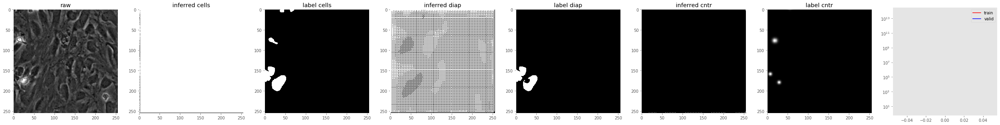

time per it: 5.815760


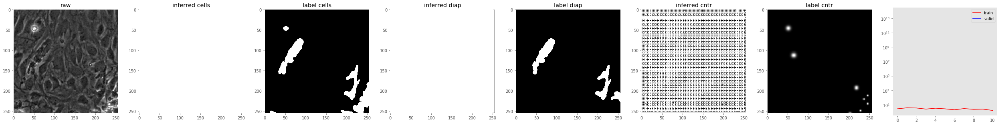

time per it: 2.066132


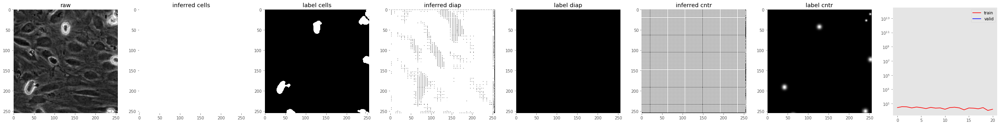

time per it: 2.055672


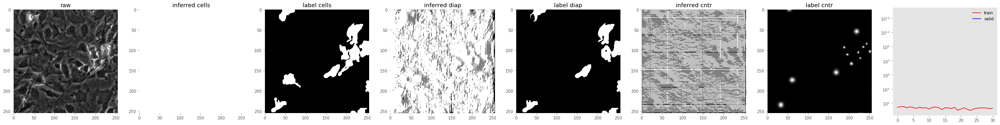

time per it: 1.983920


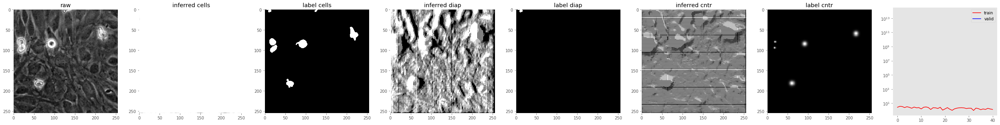

time per it: 1.981459


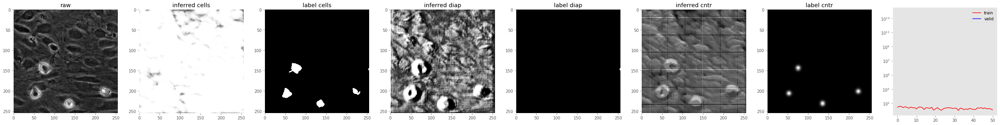

time per it: 2.015540


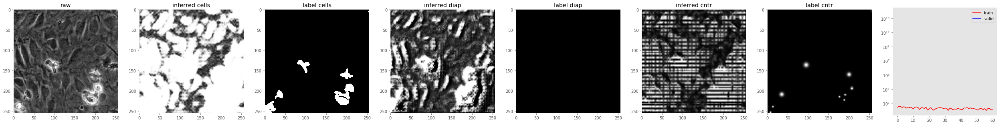

time per it: 2.008505


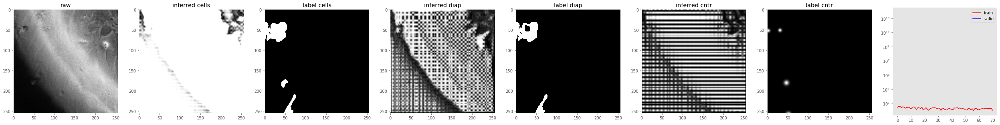

time per it: 2.037901


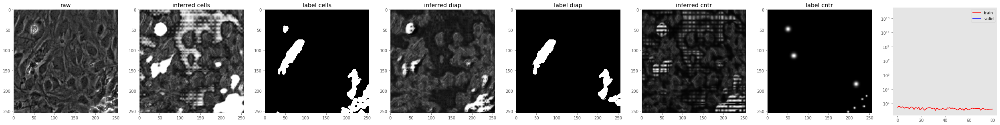

time per it: 2.023996


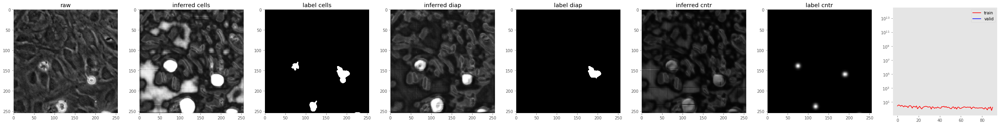

time per it: 2.052848
feed dict for validation


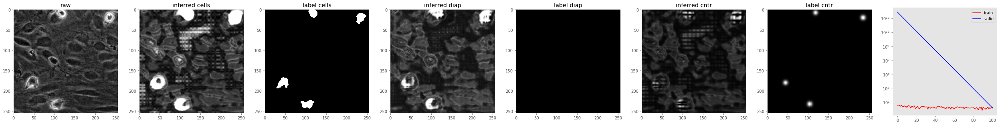

Setting lr=0.000500
time per it: 1.950455
feed dict for validation


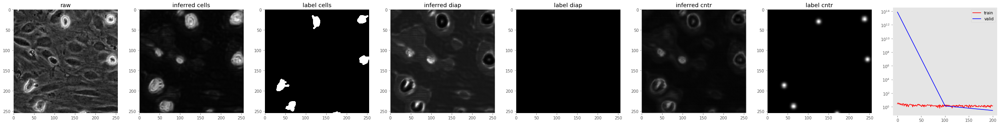

time per it: 1.957887
feed dict for validation


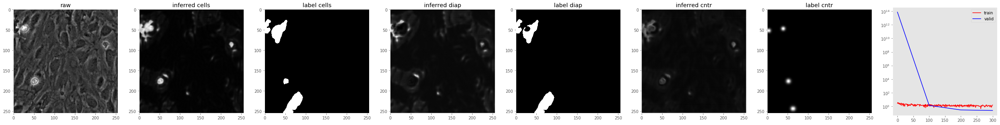

time per it: 1.972272
feed dict for validation


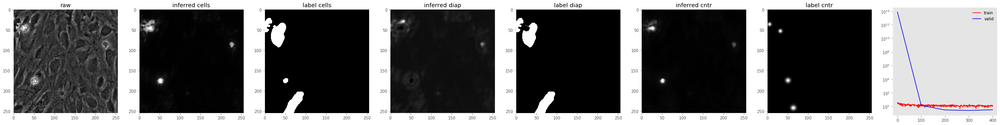

time per it: 1.966340
feed dict for validation


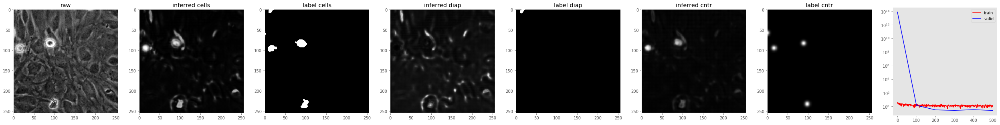

time per it: 1.736223
feed dict for validation


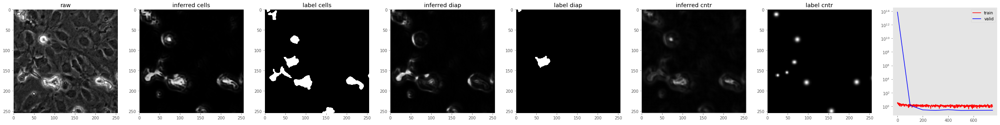

Setting lr=0.001000
time per it: 1.739873
feed dict for validation


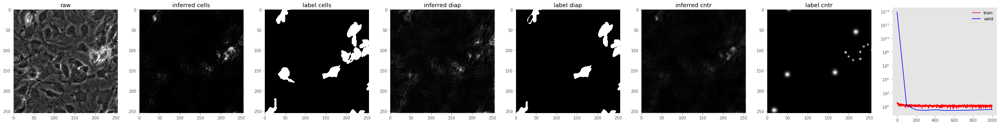

time per it: 1.738924
feed dict for validation


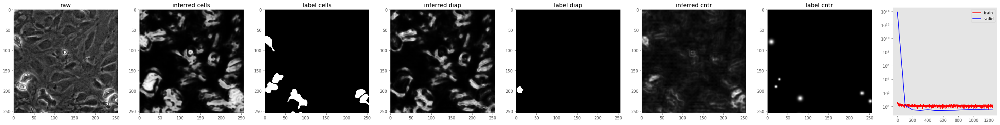

time per it: 1.740266
feed dict for validation


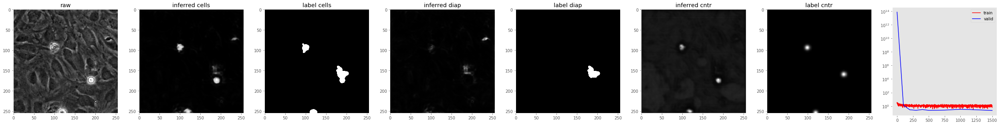

time per it: 1.730957
feed dict for validation


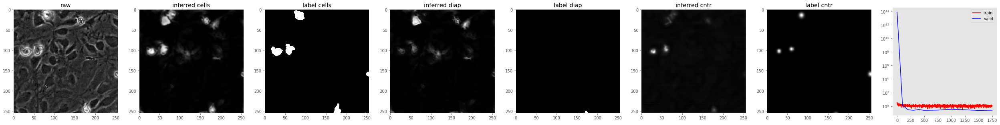

time per it: 1.712823
feed dict for validation


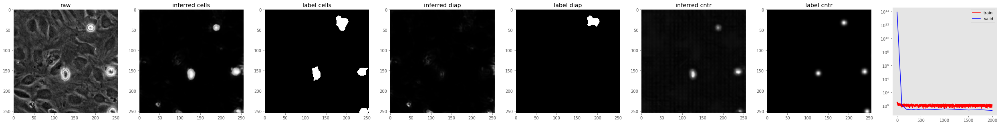

time per it: 1.595624
feed dict for validation


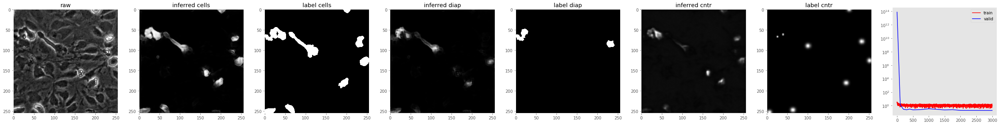

time per it: 1.584254
feed dict for validation


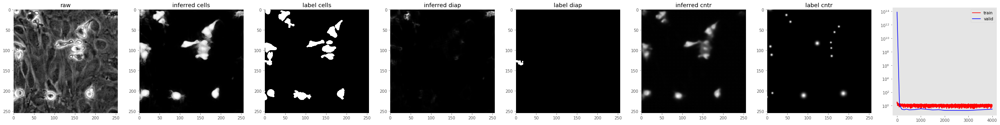

time per it: 1.583945
feed dict for validation


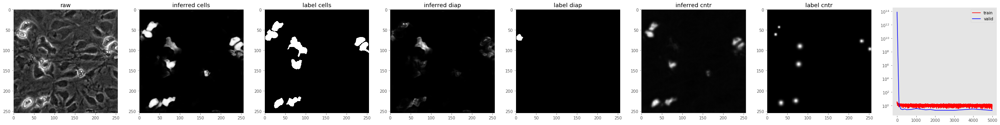

time per it: 1.541372
feed dict for validation


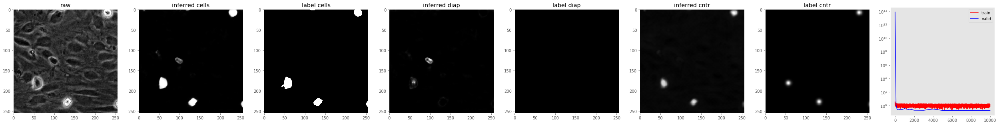

time per it: 1.537417
feed dict for validation


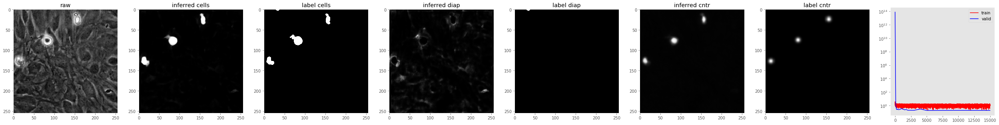

Setting lr=0.000500
time per it: 1.537250
feed dict for validation


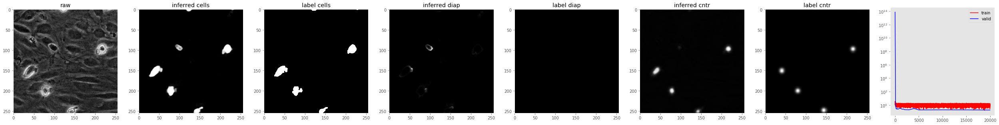

time per it: 1.536842
feed dict for validation


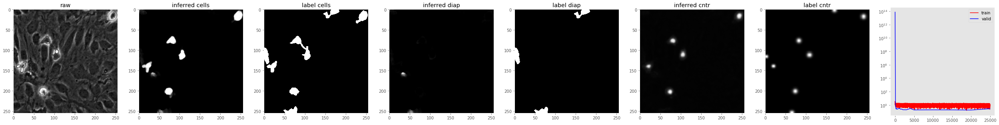

time per it: 1.542485
feed dict for validation


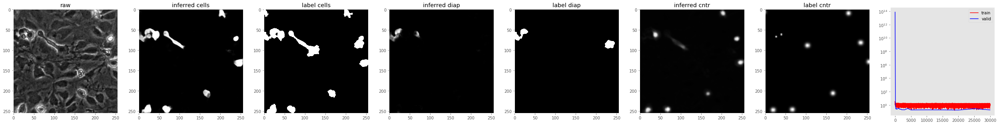

time per it: 1.539128
feed dict for validation


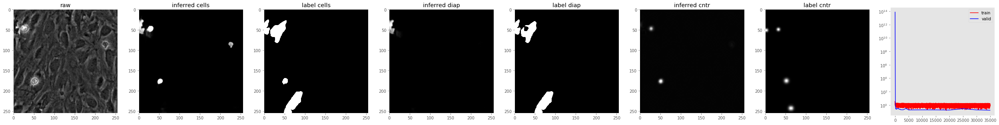

time per it: 1.540790
feed dict for validation


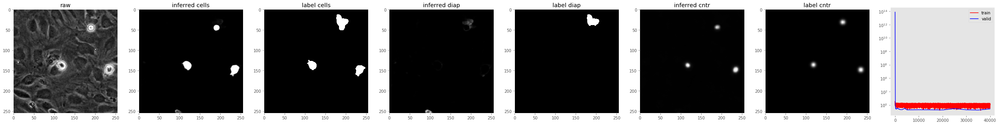

In [12]:
n_it = 40000
t_str = t.train(n_iter=n_it, learning_rate=0.001,
        learning_rate_factors={0:0.25, 200:0.5, 1000:1, 20000:0.5, 40000:0.25, 90000:0.16})

In [13]:
#t.plot_validation(t_str, n_it)

In [14]:
with g.as_default():
    with tf.device('/gpu:0'):
        map_cell_p = output[..., 0]>0.5
        map_cell_l = label[..., 0]>0
        
        map_diap_p = output[..., 1]>0.5
        map_diap_l = diapd[..., 0]>0
        
        i = tf.logical_and(map_cell_p, map_cell_l)
        u = tf.logical_or(map_cell_p, map_cell_l)
        
        i_s = tf.reduce_sum(tf.cast(i, tf.float32))
        u_s = tf.reduce_sum(tf.cast(u, tf.float32))
        
        iou_cell = i_s / u_s
        
        i = tf.logical_and(map_diap_p, map_diap_l)
        u = tf.logical_or(map_diap_p, map_diap_l)
        
        i_s = tf.reduce_sum(tf.cast(i, tf.float32))
        u_s = tf.reduce_sum(tf.cast(u, tf.float32))
        
        iou_diap = i_s / u_s
        
        iou = tf.stack([iou_cell, iou_diap], axis=0)

In [15]:
iou_map = t.get_IoU_validation(t_str, n_it, [iou])

INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-1
INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-11
INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-21
INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-31
INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-41
INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-51
INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-61
INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-71
INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-81
INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_

20000 0.62370646 0.12906736


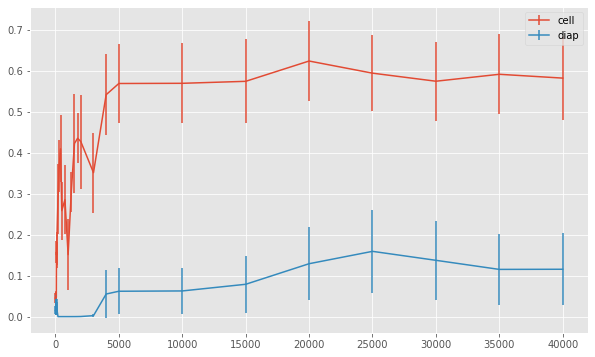

In [22]:
# plot ~ IoU
times = []
c_iou = []
d_iou = []
cs_iou = []
ds_iou = []

for key, val in iou_map.items():
    a = np.stack(val).squeeze()
    c_ious = a[:,0]
    d_ious = a[:,1]
    
    c_ious = c_ious[~np.isnan(c_ious)]
    d_ious = d_ious[~np.isnan(d_ious)]
    
    c_iou.append(c_ious.mean())
    d_iou.append(d_ious.mean())
    cs_iou.append(c_ious.std())
    ds_iou.append(d_ious.std())
    times.append(key)
    
c_iou = np.array( c_iou)
d_iou = np.array( d_iou)
cs_iou = np.array(cs_iou)
ds_iou = np.array(ds_iou)

plt.figure(figsize=(10, 6))
plt.errorbar(times, c_iou, yerr=cs_iou, label='cell')
plt.errorbar(times, d_iou, yerr=ds_iou, label='diap')
plt.legend()
idx = np.argmax(c_iou)
print(times[idx], c_iou[idx], d_iou[idx])

In [17]:
import pickle
dict_hist = {'tr': t.tra_loss_hist, 'val': t.val_loss_hist, 'valt': t.val_hist_time}
pckl_path = t.models_save_dir+'/model_'+t.model_name+'_'+t_str+'/'
pckl_name = pckl_path+'loss_hist.pckl'
with open(pckl_name, 'wb') as handle:
    pickle.dump(dict_hist, handle, protocol=pickle.HIGHEST_PROTOCOL)

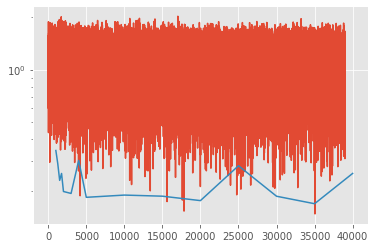

In [18]:
t0 = 1000
plt.semilogy(dict_hist['tr'][0][t0:])
vt = np.array(dict_hist['valt'])
vh = np.array(dict_hist['val'][0])

idx_in_t = vt>=t0
plt.semilogy(vt[idx_in_t], vh[idx_in_t])

INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-10001
INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-20001
INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-30001
INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-40000


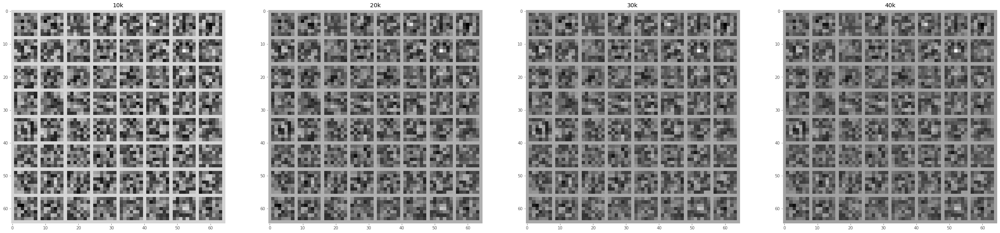

(None, <Figure size 3168x720 with 4 Axes>)

In [19]:
draw_idxs = [10001, 20001, 30001, 40000]

w0 = g.get_tensor_by_name('L0/W:0')

flts = []
lbls = []

for d_idx in draw_idxs:
    sess = t.get_session(start_params_dict={'time':t_str, 'idx':d_idx})
    w0r = sess.run(w0)
    flts.append(w0r.transpose(2, 3, 0, 1).reshape(-1, 7, 7))
    sess.close()
    
    lbls.append(f'{d_idx//1000}k')

ims = [iio.montage(f) for f in flts]
iio.draw_samples(ims, lbls)

In [23]:
flt_names = ['L%d/W:0' % idx  for idx in range(7)]
flts = [g.get_tensor_by_name(flt_name) for flt_name in flt_names]
sess = t.get_session(start_params_dict={'time':t_str, 'idx':40000})
flts_res = sess.run(flts)
sess.close()

INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-40000


In [25]:
flts_res_1d = [f.reshape((-1, f.shape[-1])).transpose() for f in flts_res]

In [26]:
flts_res_1d[6].shape

(512, 2304)

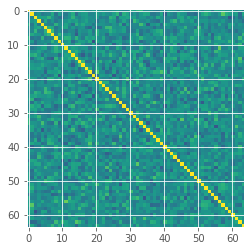

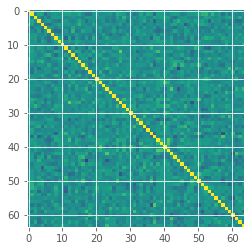

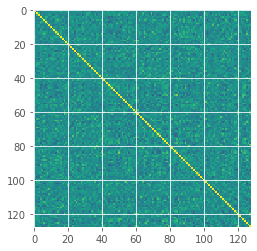

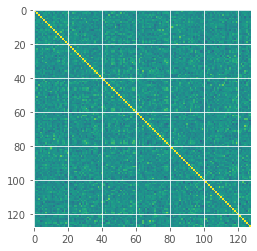

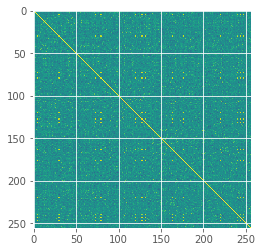

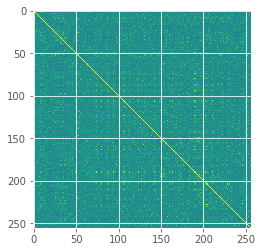

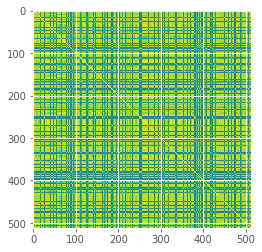

In [27]:
for f in flts_res_1d:
    cm = np.corrcoef(f)
    plt.imshow(cm, vmin=-1, vmax=1)
    plt.show()

# Save validation predition for performance evaluation

In [29]:
%%time
mb_sz = 4

out_d = {'in':v.inputs_tiles[0][:, 2],
         'gt':np.stack([v.outputs_tiles[0][:, 2],
                        v.outputs_tiles[1][:, 2],
                        v.outputs_tiles[2][:, 2]
                       ], axis=-1),
         'pred':{}
        }
pred = out_d['pred']
save_times = [10000, 15000, 20000, 25000, 30000, 35000, 39999]

for t_idx in save_times:
    tm = t_idx + 1
    sess = t.get_session(start_params_dict={'time':t_str, 'idx':tm})
    n_tiles = len(v.inputs_tiles[0])
    n_it = n_tiles//mb_sz
    
    all_out = []
    for i in range(n_it):
        i_b = i*mb_sz
        i_e = i_b+mb_sz
        
        it = v.inputs_tiles[0][i_b:i_e]
        #stk0, lbl0, dia0, cnt0, dst0
        out = sess.run(output, feed_dict={stk0:it, phase_train:False})
        all_out.append(out)
    sess.close()

    all_out_a = np.concatenate(all_out, axis=0)
    pred[tm] = all_out_a

valid_summary_name = os.path.dirname(t.get_checkpoint_file(start_params_dict={'time':t_str, 'idx':0}) )
valid_summary_name = os.path.join(valid_summary_name, 'valid_summ.pckl')

import pickle

with open(valid_summary_name, 'wb') as handle:
    pickle.dump(out_d, handle, protocol=pickle.HIGHEST_PROTOCOL)
    
del out_d

INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-10001
INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-15001
INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-20001
INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-25001
INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-30001
INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-35001
INFO:tensorflow:Restoring parameters from BBB/model_BBB_BN_TV_FCN4_HN_CDC_2D_2021.07.06_16-25/model-40000
CPU times: user 2min 49s, sys: 56.4 s, total: 3min 45s
Wall time: 3min 24s
